# ======================================
# SIMULACIÓN A LAZO ABIERTO - DOBLE PÉNDULO
# ======================================

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
if not hasattr(np, "disp"):
    np.disp = lambda x: print(x)
import roboticstoolbox as rtb
from spatialmath import SE3


# Se define el modelo del doble péndulo

El péndulo está compuesto dos eslabones tal como se muestra en la siguiente figura. La gravedad apunta constantemente en el sentido contrario a $Y_0$

En la definición del modelo se introducen los datos provistos en el enunciado, pero tambien los parámetros del rozamiento 

In [88]:
dp = rtb.DHRobot(
    [
        rtb.RevoluteDH(a=0.2,m=1.5,
            r=np.array([-0.1, 0, 0]),
            I=np.array([0,0,0,0,0,0,0,0,1e-3]),
            B=0.02, G=1),
        rtb.RevoluteDH(a=0.2,m=1,
            r=np.array([-0.1, 0, 0]),
            I=np.array([0,0,0,0,0,0,0,0,1e-4]),
            B=0.02, G=1)
    ],
    gravity = np.array([0, -9.81, 0]), # Ojo con el signo, la gravedad va hacia abajo con signo positivo
    name="dp")

print(dp)
print(dp.dynamics())

DHRobot: dp, 2 joints (RR), dynamics, standard DH parameters
┌─────┬────┬─────┬──────┐
│ θⱼ  │ dⱼ │ aⱼ  │  ⍺ⱼ  │
├─────┼────┼─────┼──────┤
│  q1 │  0 │ 0.2 │ 0.0° │
│  q2 │  0 │ 0.2 │ 0.0° │
└─────┴────┴─────┴──────┘

┌──┬──┐
└──┴──┘

┌───────┬──────┬──────────────┬─────────────────────────────┬────┬───────┬────────┬────┐
│   j   │  m   │      r       │              I              │ Jm │   B   │   Tc   │ G  │
├───────┼──────┼──────────────┼─────────────────────────────┼────┼───────┼────────┼────┤
│ link1 │  1.5 │ -0.1,  0,  0 │  0,  0,  0.001,  0,  0,  0  │  0 │  0.02 │  0,  0 │  1 │
│ link2 │  1   │ -0.1,  0,  0 │  0,  0,  0.0001,  0,  0,  0 │  0 │  0.02 │  0,  0 │  1 │
└───────┴──────┴──────────────┴─────────────────────────────┴────┴───────┴────────┴────┘

None


# Simulación a *Lazo Abierto*

Se comenzó haciendo una simulación de la dinámica de la planta estudiando el modelo de simulación completo de la dinámica que es no lineal y acoplado  basado en la siguiente ecuación.

$
N K_t u = J_m N^2 \ddot q + B N^2 \dot q + F_r N \mathrm{sign}(\dot q) + M(q)\ddot q + C(q,\dot q)\dot q + G(q)
$

Si se aplica una simplificación, basándose en las siguientes hipótesis:

* N \approx = 100
* $(\dot q, \ddot q)$ pequeñas
* pesos balanceados

Se obtiene la siguiente ecuación de la dinámica de un eje del sistema, donde se cumple que es un modelo lineal, SISO y desacoplado.

$
N \tau_m = (J_m N^2 + \overline{m})\ddot q + B N^2 \dot q + \tau_p
$

In [89]:
def dynamics_nonlinear(t, y, use_coulomb=False, Fc=None, k_smooth=50.0):
    """
    Modelo dinámico completo del doble péndulo con reductores.
    Incluye efectos de M(q), C(q, qd), G(q), fricción viscosa y opcionalmente Coulomb.
    """
    n = dp.n
    q = y[:n]
    qd = y[n:]
    tau_m = np.zeros(n)  # torque motor (entrada), lazo abierto

    # --- Parámetros de cada articulación ---
    N_vec = np.array([getattr(link, 'G', 1.0) for link in dp.links])   # relación de reducción
    B_vec = np.array([getattr(link, 'B', 0.0) for link in dp.links])   # fricción viscosa eje
    Jm_vec = np.zeros(n)  # si se conoce la inercia del motor, definir aquí

    # --- Dinámica del robot ---
    M = dp.inertia(q)
    C = dp.coriolis(q, qd)
    G = dp.gravload(q)

    # --- Fricción viscosa y de Coulomb ---
    tau_visc = B_vec * (N_vec**2) * qd

    if use_coulomb:
        if Fc is None:
            Fc = np.zeros(n)
        tau_coul = Fc * N_vec * np.tanh(k_smooth * qd)
    else:
        tau_coul = np.zeros(n)

    tau_fric = tau_visc + tau_coul

    # --- Ecuación completa ---
    # N * τ_m = Jm * N^2 * qdd + B * N^2 * qd + F_r * N * sign(qd) + M * qdd + C * qd + G
    # -> agrupamos en torno a qdd:
    M_eff = M + np.diag(Jm_vec * N_vec**2)
    rhs = N_vec * tau_m - C @ qd - G - tau_fric
    qdd = np.linalg.solve(M_eff, rhs)

    return np.concatenate((qd, qdd))


def dynamics_lineal(t, y, use_coulomb=False, Fc=None, k_smooth=50.0):
    """
    Dinámica lineal desacoplada del doble péndulo (modelo simplificado).

    Ecuación vectorial:
        N τ_m = (J_m N² + M̄) q̈ + B N² q̇ + τ_p
    con τ_p = C(q,q̇) q̇ + G(q)

    use_coulomb : bool -> Si True, añade fricción de Coulomb suavizada.
    Fc          : np.array -> Coeficientes de fricción Coulomb [N·m].
    k_smooth    : float -> Factor de suavizado para tanh().
    """
    n = dp.n
    q = y[:n]
    qd = y[n:]

    # --- Torques motores (por ahora lazo abierto) ---
    tau_m = np.zeros(n)

    # --- Parámetros de cada articulación ---
    N_vec = np.array([getattr(link, 'G', 1.0) for link in dp.links])
    B_vec = np.array([getattr(link, 'B', 0.0) for link in dp.links])
    Jm_vec = np.zeros(n)  # si no se conocen, se asume 0

    # --- Dinámica del robot (solo para τ_p) ---
    M = dp.inertia(q)
    C = dp.coriolis(q, qd)
    G = dp.gravload(q)
    tau_p = C @ qd + G  # efectos del péndulo

    # --- Inercia equivalente M̄ (diagonal de M) ---
    M_bar = np.diag(M)

    # --- Fricción viscosa reflejada por N² ---
    tau_visc = B_vec * (N_vec ** 2) * qd

    # --- Fricción de Coulomb opcional (suavizada) ---
    if use_coulomb:
        if Fc is None:
            Fc = np.zeros(n)
        tau_coul = Fc * np.tanh(k_smooth * qd)
    else:
        tau_coul = np.zeros(n)

    tau_fric = tau_visc + tau_coul

    # --- Cálculo de aceleraciones (modelo lineal vectorial) ---
    denom = Jm_vec * (N_vec ** 2) + M_bar  # (J_m N² + M̄)
    numer = N_vec * tau_m - B_vec * (N_vec ** 2) * qd - tau_p - tau_coul
    qdd = numer / denom

    return np.concatenate((qd, qdd))

A continuación se hacen 3 simulaciones de 5 segundos a lazo abierto para comparar ambos modelos. Las condiciones iniciales de cada simulación son:

* **Simulación A** - Brazo arriba (equilibrio inestable) casi en reposo. $(q, \dot{q}) = ([\frac{\pi}{2}, 0], [0.001, 0.001])$

* **Simulación B** - Brazo abajo (caída lenta). $(q, \dot{q}) = ([\frac{-\pi}{2} + \frac{\pi}{20}, 0], [0, 0])$

* **Simulación C** - Brazo a 0 grados (caída rápida). $(q, \dot{q}) = ([0, 0], [0, 0])$

Para poder simular se usa la función ``solve_ivp`` de ``scipy.integrate`` que sirve para resolver un problema de ecuaciones en diferencia (ODEs) dadas unas condiciones iniciales.

Para comparar ambos casos se sigue el error entre ambas simulaciones.

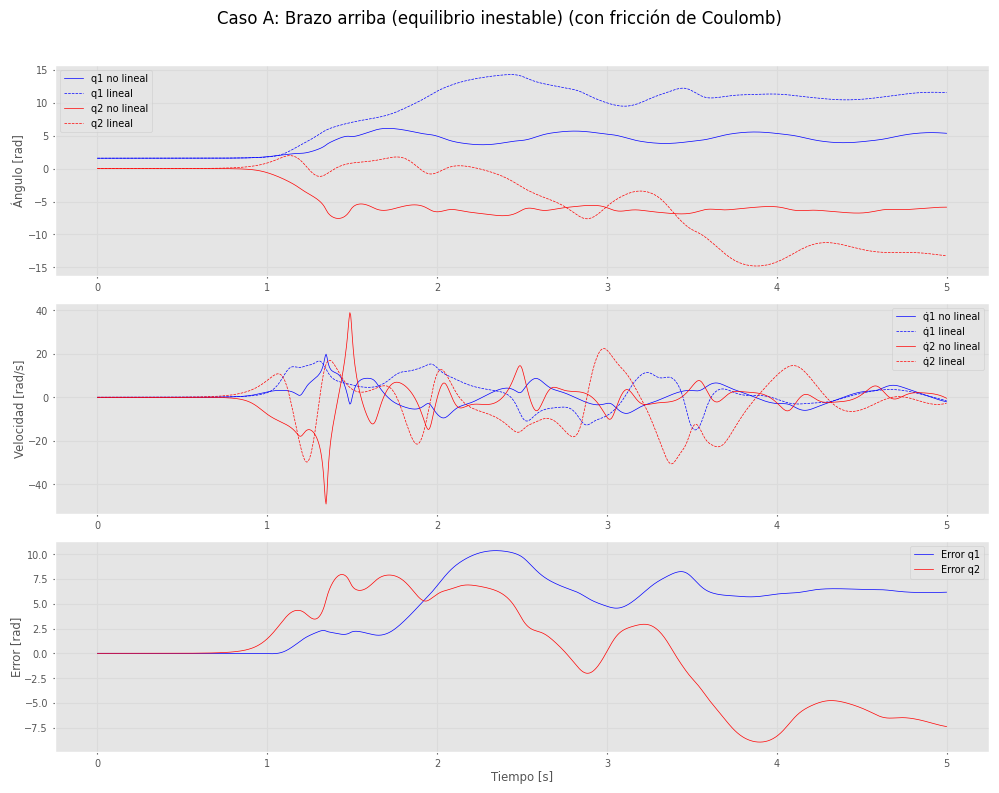

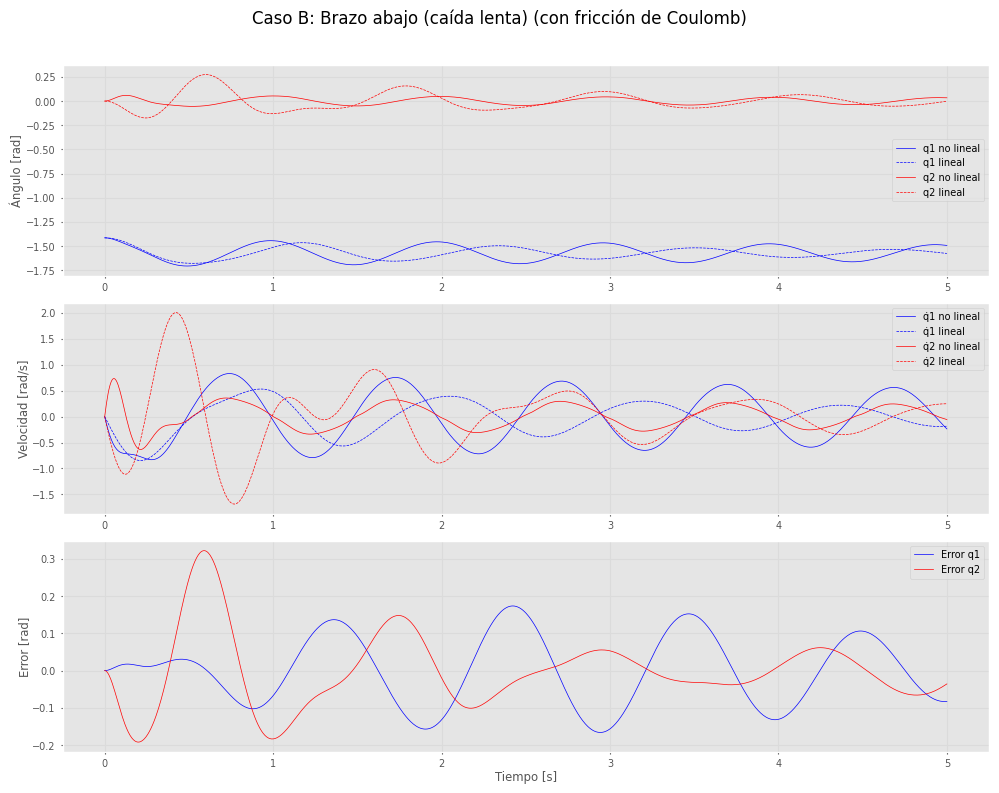

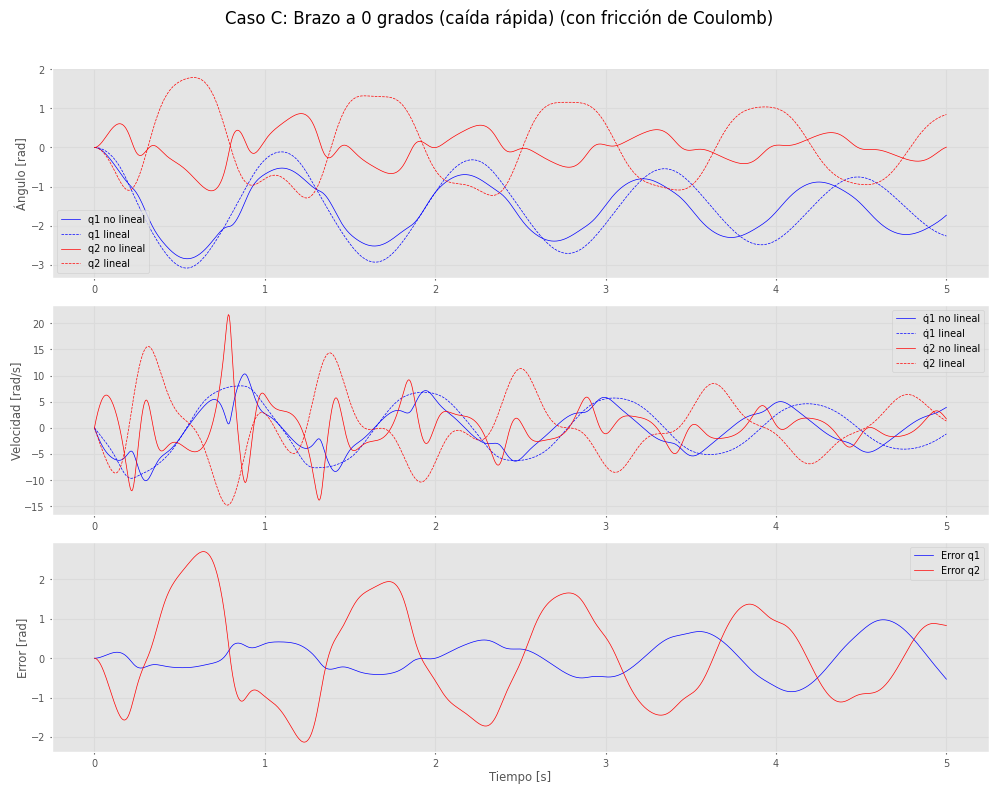

In [90]:
from scipy.integrate import solve_ivp

# --- Condiciones iniciales ---
cases = {
    "Caso A: Brazo arriba (equilibrio inestable)": np.concatenate(([np.pi/2, 0.0], [0.001, 0.001])),
    "Caso B: Brazo abajo (caída lenta)": np.concatenate(([-np.pi/2 + np.pi/20, 0.0], [0.0, 0.0])),
    "Caso C: Brazo a 0 grados (caída rápida)": np.concatenate(([0.0, 0.0], [0.0, 0.0])),
}

t_final = 5.0
t_eval = np.linspace(0, t_final, 1000) # Tiempo de muestreo 5ms

# --- Parámetro de fricción de Coulomb ---
Fc = np.array([0.001, 0.001])

# --- Funciónes auxiliares para simular ambos modelos ---
def simulate_model_nl(y0):
    sol = solve_ivp(
        lambda t, y: dynamics_nonlinear(t, y, use_coulomb=True, Fc=Fc),
        [0, t_final],
        y0,
        t_eval=t_eval,
        rtol=1e-5, atol=1e-7
    )
    return sol

def simulate_model_lin(y0):
    sol = solve_ivp(
        lambda t, y: dynamics_lineal(t, y, use_coulomb=True, Fc=Fc),
        [0, t_final],
        y0,
        t_eval=t_eval,
        rtol=1e-5, atol=1e-7
    )
    return sol

def simulate_models(y0):
    return simulate_model_nl(y0), simulate_model_lin(y0)


# --- Diccionario donde se guardarán todos los resultados de simulación ---
results = {}

# --- Simular y guardar ---
for title, y0 in cases.items():
    sol_nl, sol_lin = simulate_models(y0)

    # Extraer resultados
    t = sol_nl.t
    q_nl, qd_nl = sol_nl.y[0:2, :], sol_nl.y[2:4, :]
    q_lin, qd_lin = sol_lin.y[0:2, :], sol_lin.y[2:4, :]

    # Errores
    err_q = q_lin - q_nl
    err_qd = qd_lin - qd_nl

    # Guardar todo en results
    results[title] = {
        "t": t,
        "nonlinear": sol_nl,
        "linear": sol_lin,
        "q_nl": q_nl,
        "qd_nl": qd_nl,
        "q_lin": q_lin,
        "qd_lin": qd_lin,
        "error_q": err_q,
        "error_qd": err_qd,
        "y0": y0,
    }

    # --- Graficar como antes ---
    plt.figure(figsize=(10, 8))
    plt.suptitle(title + " (con fricción de Coulomb)", fontsize=12)

    # 1️⃣ Ángulos
    plt.subplot(3, 1, 1)
    plt.plot(t, q_nl[0], 'b', label='q1 no lineal')
    plt.plot(t, q_lin[0], 'b--', label='q1 lineal')
    plt.plot(t, q_nl[1], 'r', label='q2 no lineal')
    plt.plot(t, q_lin[1], 'r--', label='q2 lineal')
    plt.ylabel('Ángulo [rad]')
    plt.legend(); plt.grid(True)

    # 2️⃣ Velocidades
    plt.subplot(3, 1, 2)
    plt.plot(t, qd_nl[0], 'b', label='q̇1 no lineal')
    plt.plot(t, qd_lin[0], 'b--', label='q̇1 lineal')
    plt.plot(t, qd_nl[1], 'r', label='q̇2 no lineal')
    plt.plot(t, qd_lin[1], 'r--', label='q̇2 lineal')
    plt.ylabel('Velocidad [rad/s]')
    plt.legend(); plt.grid(True)

    # 3️⃣ Errores
    plt.subplot(3, 1, 3)
    plt.plot(t, err_q[0], 'b', label='Error q1')
    plt.plot(t, err_q[1], 'r', label='Error q2')
    plt.ylabel('Error [rad]')
    plt.xlabel('Tiempo [s]')
    plt.legend(); plt.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


Para visualizar mejor la diferencia entre ambas simulaciones se armaron animaciones del movimiento del péndulo.

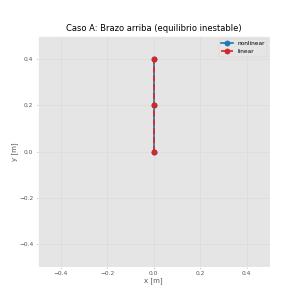

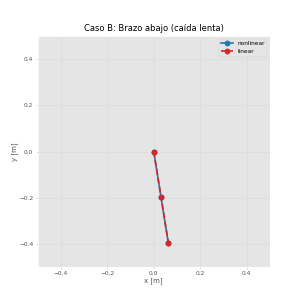

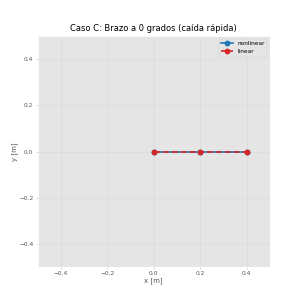

In [91]:
from IPython.display import Image
import os

def animate_pendulum(sol_nl, sol_lin, title, label_nl, label_lin, filename):
    """
    Crea y guarda un GIF comparando modelo no lineal y lineal.
    
    Parámetros:
        sol_nl: solución solve_ivp del modelo no lineal
        sol_lin: solución solve_ivp del modelo lineal
        title: título de la animación
        label_nl: etiqueta que aparecerá en la leyenda para el modelo no lineal
        label_lin: etiqueta que aparecerá en la leyenda para el modelo lineal
        filename: nombre del archivo GIF a guardar
    """

    # Crear carpeta "gifs/" si no existe
    os.makedirs("gifs", exist_ok=True)
    filename = f"gifs/{filename}"

    t = sol_nl.t
    q1_nl, q2_nl = sol_nl.y[0], sol_nl.y[1]
    q1_lin, q2_lin = sol_lin.y[0], sol_lin.y[1]

    a1 = getattr(dp.links[0], 'a', 0.2)
    a2 = getattr(dp.links[1], 'a', 0.2)

    # --- Posiciones ---
    def get_positions(q1, q2):
        x1 = a1 * np.cos(q1)
        y1 = a1 * np.sin(q1)
        x2 = x1 + a2 * np.cos(q1 + q2)
        y2 = y1 + a2 * np.sin(q1 + q2)
        return x1, y1, x2, y2

    x1_nl, y1_nl, x2_nl, y2_nl = get_positions(q1_nl, q2_nl)
    x1_lin, y1_lin, x2_lin, y2_lin = get_positions(q1_lin, q2_lin)

    # --- Crear figura ---
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.set_xlim(-0.5, 0.5)
    ax.set_ylim(-0.5, 0.5)
    ax.set_xlabel('x [m]')
    ax.set_ylabel('y [m]')
    ax.set_title(title)

    # Pendulo no lineal (azul)
    line_nl, = ax.plot([], [], 'o-', lw=2, color='tab:blue', label=label_nl)

    # Pendulo lineal (rojo)
    line_lin, = ax.plot([], [], 'o--', lw=2, color='tab:red', label=label_lin)

    # Trazas
    trace_nl, = ax.plot([], [], '-',  lw=1, color='tab:orange', alpha=0.5)
    trace_lin, = ax.plot([], [], '--', lw=1, color='tab:green', alpha=0.5)

    # Agregar leyenda dinámica con las etiquetas proporcionadas
    ax.legend(loc="upper right")

    trace_x_nl, trace_y_nl = [], []
    trace_x_lin, trace_y_lin = [], []

    # --- Actualización por frame ---
    def update(i):
        # No lineal
        thisx_nl = [0, x1_nl[i], x2_nl[i]]
        thisy_nl = [0, y1_nl[i], y2_nl[i]]
        line_nl.set_data(thisx_nl, thisy_nl)

        trace_x_nl.append(x2_nl[i])
        trace_y_nl.append(y2_nl[i])
        trace_nl.set_data(trace_x_nl, trace_y_nl)

        # Lineal
        thisx_lin = [0, x1_lin[i], x2_lin[i]]
        thisy_lin = [0, y1_lin[i], y2_lin[i]]
        line_lin.set_data(thisx_lin, thisy_lin)

        trace_x_lin.append(x2_lin[i])
        trace_y_lin.append(y2_lin[i])
        trace_lin.set_data(trace_x_lin, trace_y_lin)

        return line_nl, line_lin, trace_nl, trace_lin

    # --- Crear animación ---
    step = 5
    frames = range(0, len(t), step)
    ani = FuncAnimation(fig, update, frames=frames, interval=30, blit=True)

    ani.save(filename, writer='pillow', fps=25, dpi=60)
    plt.close(fig)

    return Image(filename=filename)



gifs = []
caso = ['A','B','C']
i=0
for title, y0 in cases.items():
    sol_nl = results[title]["nonlinear"]
    sol_lin = results[title]["linear"]

    filename = f"pendulo_comparacion_caso_{caso[i]}.gif"

    gif = animate_pendulum(
        sol_nl, sol_lin,
        title=title,
        label_nl="nonlinear",
        label_lin="linear",
        filename=filename
    )
    
    gifs.append(gif)
    i += 1

display(*gifs)

Analizando estas simulaciones se puede ver la clara diferencia que hay entre el comportamiento de ambos modelos. El péndulo doble es un sistema caótico, por lo que una pequeña diferencia entre los modelos hace que el comportamiento final sea extremadamente diferente por mas que se cumplan las hipótesis de simplificación.

El resto del trabajo se realizará con el modelo completo de la dinámica de la planta. Este es el modelo del problema directo de la dinámica que resuelve el método `fdyn` nativo de la librería `roboticstoolbox` al definir el péndulo como el robot `dp`.

---

## Simulaciones del péndulo a lazo abierto usando ``fdyn`` de `roboticstoolbox`

Se repite la simulación de los 3 casos usando la herramienta de resolución de la dinámica directa `fdyn` provista por `roboticstoolbox` para hacer una comparación del comportamiento.

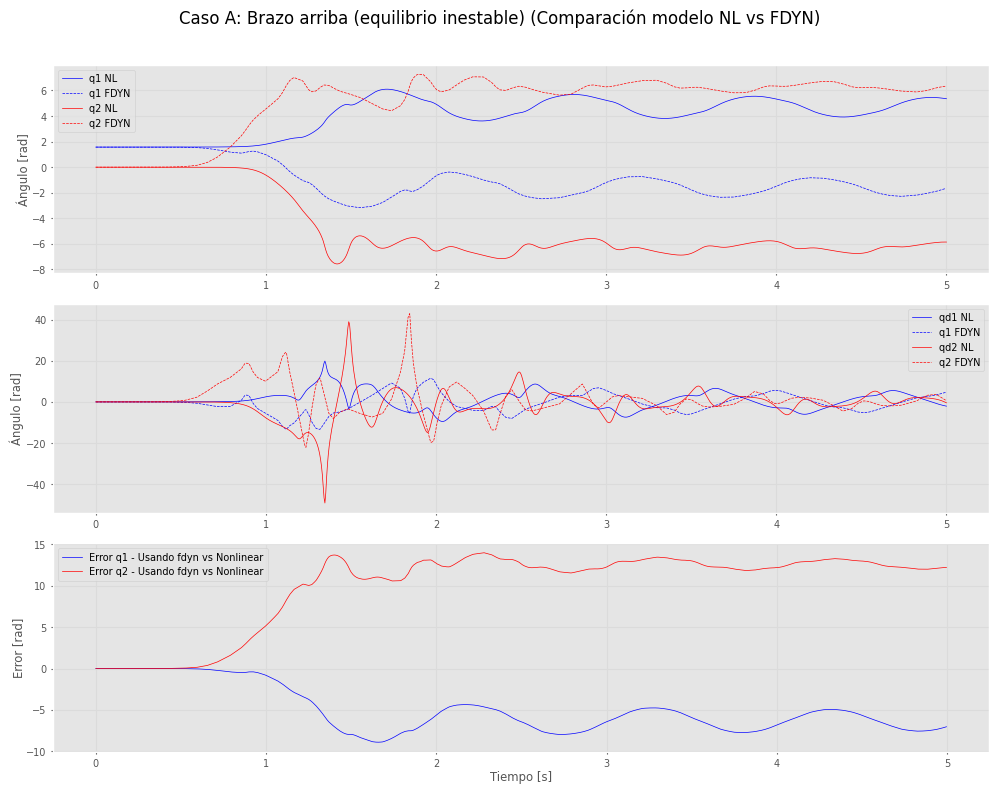

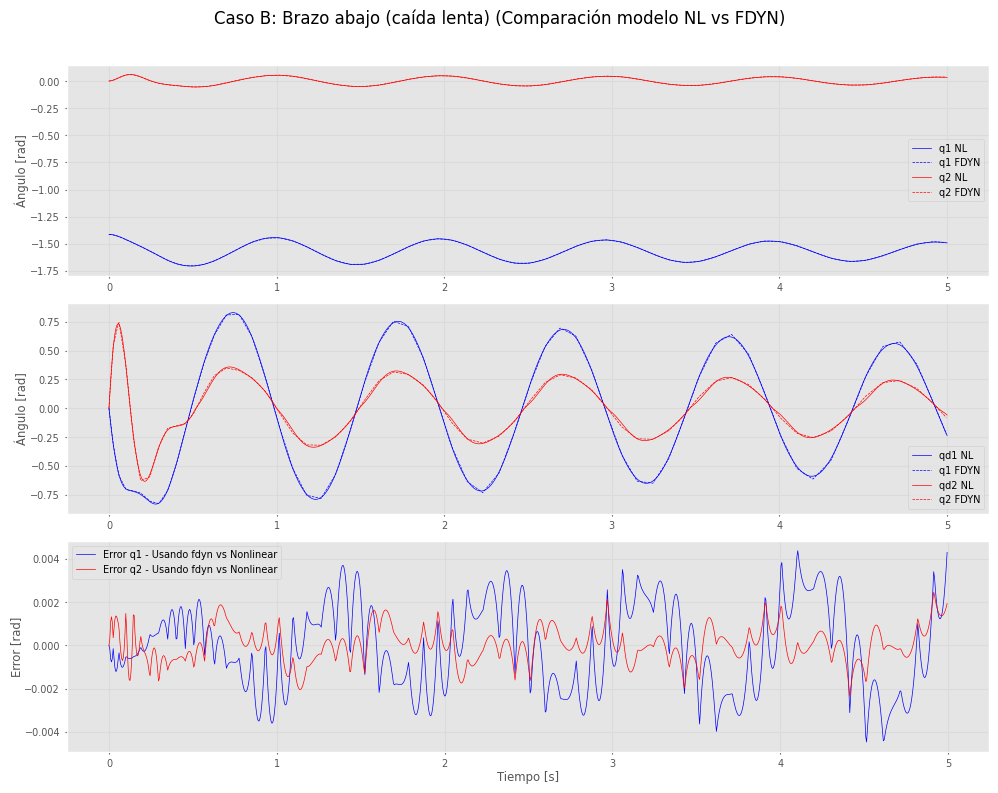

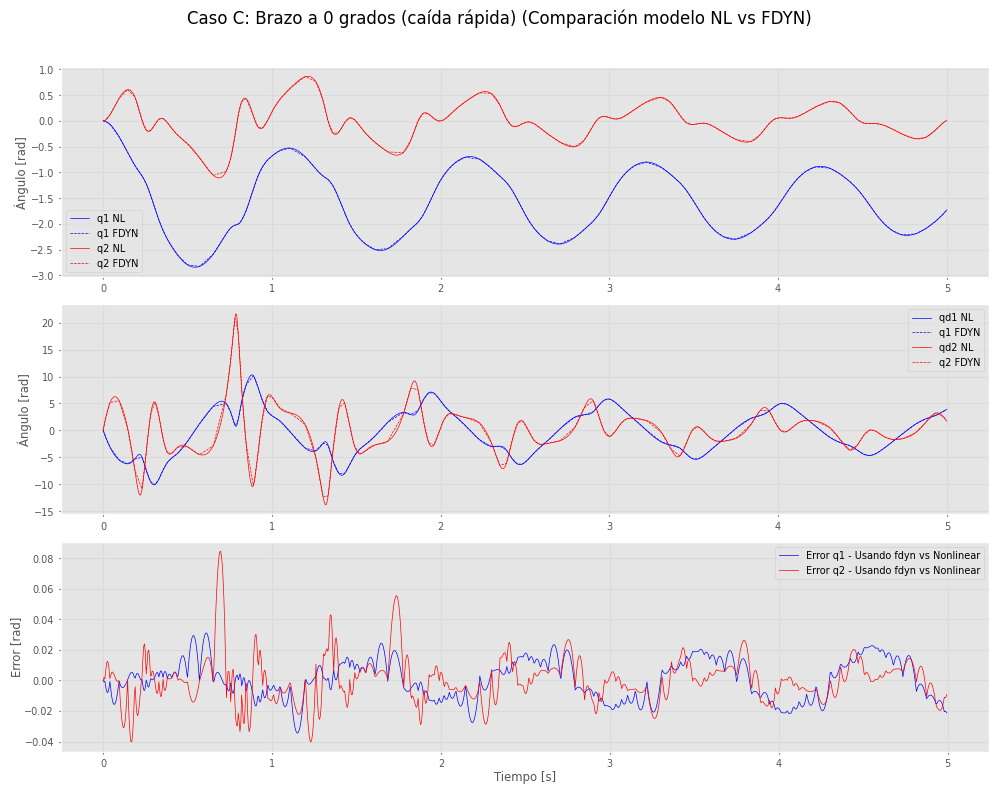

In [ ]:
def simulate_fdyn(y0, t_final=5.0, dt = 0.005, controler = None):
    q0 = y0[:2]
    qd0 = y0[2:]
    sol_fdyn = dp.fdyn(T = t_final, q0=q0,qd0=qd0, dt =dt, Q=controler)
    return sol_fdyn


t_final = 5 #Simular por 5s
dt = 0.005 #dt = 5ms
results_fd = {}
for title, y0 in cases.items():

    # ------- 🔥 Nueva simulación FDYN -------
    sol_fdyn = simulate_fdyn(y0, t_final = t_final, dt=dt)

    # ---------- Extraer resultados ----------
    t = sol_fdyn.t
    q1_fdyn, q2_fdyn = sol_fdyn.q[:,0], sol_fdyn.q[:,1]
    qd1_fdyn, qd2_fdyn = sol_fdyn.qd[:,0], sol_fdyn.qd[:,1]
    

    results_fd[title] = {
            "t": t,
            "sol":sol_fdyn,
            "q1": q1_fdyn,
            "q2": q2_fdyn,
            "qd1": qd1_fdyn,
            "qd2": qd2_fdyn
        }


for title, y0 in cases.items():

    # --- Gráficos ---
    plt.figure(figsize=(10, 8))
    plt.suptitle(title + " (Comparación modelo NL vs FDYN)", fontsize=12)

    # Ángulos
    plt.subplot(3, 1, 1)
    plt.plot(results[title]["t"], results[title]["q_nl"][0,:], 'b', label='q1 NL')
    plt.plot(results_fd[title]["t"], results_fd[title]["q1"], 'b--', label='q1 FDYN')
    plt.plot(results[title]["t"], results[title]["q_nl"][1,:], 'r', label='q2 NL')
    plt.plot(results_fd[title]["t"], results_fd[title]["q2"], 'r--', label='q2 FDYN')
    
    plt.ylabel('Ángulo [rad]')
    plt.legend(); plt.grid(True)

    # Velocidades
    plt.subplot(3, 1, 2)
    plt.plot(results[title]["t"], results[title]["qd_nl"][0,:], 'b', label='qd1 NL')
    plt.plot(results_fd[title]["t"], results_fd[title]["qd1"], 'b--', label='q1 FDYN')
    plt.plot(results[title]["t"], results[title]["qd_nl"][1,:], 'r', label='qd2 NL')
    plt.plot(results_fd[title]["t"], results_fd[title]["qd2"], 'r--', label='q2 FDYN')
    
    plt.ylabel('Ángulo [rad]')
    plt.legend(); plt.grid(True)

    # ------------------- Cálculo del error -------------------
    err_q1 = results_fd[title]["q1"] - results[title]["q_nl"][0,:]
    err_q2 = results_fd[title]["q2"] - results[title]["q_nl"][1,:]

    # Velocidades
    # err_qd1 = results_fd[title]["qd1_fdyn"] - results[title]["qd_nl"][:,0]
    # err_qd2 = results_fd[title]["qd2_fdyn"] - results[title]["qd_nl"][:,1]


    # Errores
    plt.subplot(3, 1, 3)
    plt.plot(t, err_q1, 'b', label='Error q1 - fdyn vs Nonlinear')
    plt.plot(t, err_q2, 'r', label='Error q2 - fdyn vs Nonlinear')
    plt.ylabel('Error [rad]')
    plt.xlabel('Tiempo [s]')
    plt.legend(); plt.grid(True)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


Nuevamente se ven diferencias entre las simulaciones de los distintos modelos, pero ahora son considerablemente menores que antes. La mayor diferencia está en la primer simulación que pareciera que el péndulo en cada simulación cae para el opuesto equivocado.

En las otras dos simulaciones la diferencia es extremadamente pequeña. Esto era esperable dado que se sabe que el modelo no lineal se asemeja mucho al que utiliza `roboticstoolbox`. En el caso mas lento de todos la diferencia entre modelos es de tan solo unos mili radianes.

---

Habiendo hecho este análisis, se procede a trabajar con la función de simulación de la dinámica directa de `roboticstoolbox`.

### Animación de la simulación de dejar caer el brazo hecha con fdym

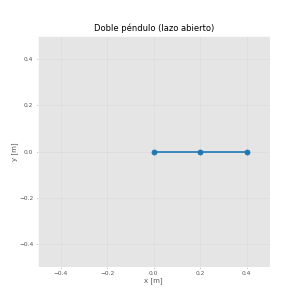

In [ ]:
# ======================================
# ANIMACIÓN - DOBLE PÉNDULO (GIF)
# ======================================

t = results_fd['Caso C: Brazo a 0 grados (caída rápida)']['t']
q1 = results_fd['Caso C: Brazo a 0 grados (caída rápida)']['q1']
q2  = results_fd['Caso C: Brazo a 0 grados (caída rápida)']['q2']


# --- Calcular posiciones de los eslabones ---
a1, a2 = 0.2, 0.2
x1 = a1 * np.cos(q1)
y1 = a1 * np.sin(q1)
x2 = x1 + a2 * np.cos(q1 + q2)
y2 = y1 + a2 * np.sin(q1 + q2)

# --- Crear figura ---
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlim(-0.5, 0.5)
ax.set_ylim(-0.5, 0.5)
ax.set_xlabel('x [m]')
ax.set_ylabel('y [m]')
ax.set_title('Doble péndulo (lazo abierto) - usando fdyn')
line, = ax.plot([], [], 'o-', lw=2, color='tab:blue')
trace, = ax.plot([], [], '-', lw=1, color='tab:orange', alpha=0.5)  # traza de la punta
trace_x, trace_y = [], []

# --- Función de actualización por frame ---
def update(i):
    # puntos del péndulo
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]
    line.set_data(thisx, thisy)
    # traza de la punta del último eslabón
    trace_x.append(x2[i])
    trace_y.append(y2[i])
    trace.set_data(trace_x, trace_y)
    return line, trace

# --- Crear animación ---
step = 3  # usar un frame cada 5 muestras
frames = range(0, len(t), step)
ani = FuncAnimation(fig, update, frames=frames, interval=60, blit=True)


# --- Guardar como GIF ---
gif_filename = "gifs/doble_pendulo_fdyn_lazo_abierto.gif"
ani.save(gif_filename, writer='pillow', fps=30, dpi=60)

plt.close(fig)  # cerrar la figura para que no se muestre el frame estático

# --- Mostrar GIF en la notebook ---
Image(filename=gif_filename)

# Lazo cerrado

Ahora se busca aplicar control a la planta. Esto nos dará la posibilidad de indicarle una referencia a seguir al péndulo mediante la aplicación de un torque en cada una de las articulaciones. 

## Control PD

$u = K_p(q^d - q) - K_d \cdot{q}$

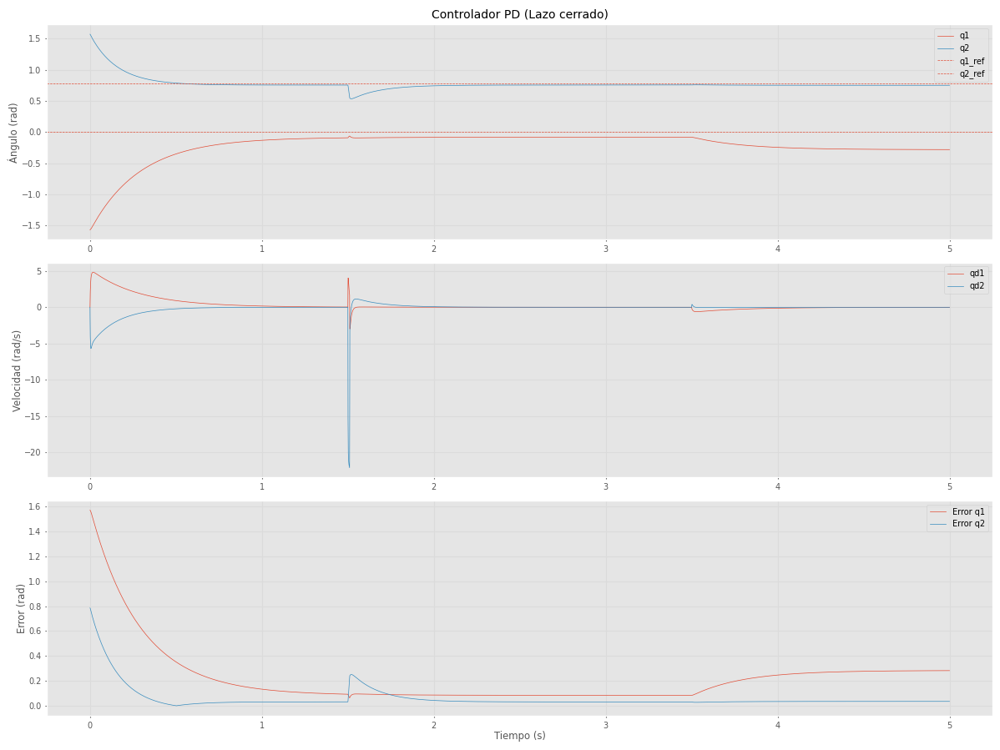

In [ ]:
def control_pd(robot, t, q, qd):
    q_actual = np.array(q)
    qd_actual = np.array(qd)
    
    error_q = q_deseado - q_actual
    error_qd = np.array([0.0, 0.0]) - qd_actual
    
    Kp = np.array([50, 25]) 
    Kd = np.array([15, 4]) 

    tau_control = Kp * error_q + Kd * error_qd
    
    # --- 2. DEFINICIÓN DE LA PERTURBACIÓN TIPO ESCALÓN E IMPULSO ---
    tau_disturbio_escalon = np.array([0.0, 0.0]) # Cero por defecto
    tau_impulso = np.array([0.0, 0.0]) # Cero por defecto
    
    t_inicio_escalon = 3.5 # ¿Cuándo empieza el escalón?
    t_inicio_impulso = 1.5 # ¿Cuándo empieza el escalón?
    t_fin_impulso = 1.51

    fuerza_escalon = 10   # ¿Qué tan grande es el torque? (3 Nm constantes)
    fuerza_impulso = 100

    # Aplicamos el escalón DESPUÉS de t=2.5s y se mantiene
    if t > t_inicio_escalon:
        tau_disturbio_escalon = np.array([fuerza_escalon, 0.0])
    
    if  t>=t_inicio_impulso and t<=t_fin_impulso:
        tau_impulso = np.array([0.0, fuerza_impulso])
    # --- 3. Torque total ---
    # El motor debe aplicar su torque de control MENOS el de la perturbación
    tau = tau_control - tau_disturbio_escalon - tau_impulso

    return tau

q_deseado = np.array([0.0, np.pi/4])
q0 = [-np.pi/2,np.pi/2]
qd_cero = [0.0, 0.0]
t_final = 5.0
tg_pd = dp.fdyn(T=t_final, q0=q0, qd0=qd_cero, Q=control_pd)

# ---------------------- Graficado ------------------------
plt.figure(figsize=(12, 9))

# ---- 1. Ángulos articulares ----
plt.subplot(3, 1, 1)
plt.plot(tg_pd.t, tg_pd.q[:,0], label="q1")
plt.plot(tg_pd.t, tg_pd.q[:,1], label="q2")

# Referencias: líneas horizontales
plt.axhline(q_deseado[0], linestyle="--", label="q1_ref")
plt.axhline(q_deseado[1], linestyle="--", label="q2_ref")

plt.ylabel("Ángulo (rad)")
plt.title("Controlador PD (Lazo cerrado)")
plt.legend(); plt.grid(True)


# ---- 2. Velocidades ----
plt.subplot(3, 1, 2)
plt.plot(tg_pd.t, tg_pd.qd[:,0], label="qd1")
plt.plot(tg_pd.t, tg_pd.qd[:,1], label="qd2")
plt.ylabel("Velocidad (rad/s)")
plt.legend(); plt.grid(True)


# ---- 3. Error ----
err_q1 = np.abs(q_deseado[0] - tg_pd.q[:,0])
err_q2 = np.abs(q_deseado[1] - tg_pd.q[:,1])

plt.subplot(3, 1, 3)
plt.plot(tg_pd.t, err_q1, label="Error q1")
plt.plot(tg_pd.t, err_q2, label="Error q2")
plt.xlabel("Tiempo (s)")
plt.ylabel("Error (rad)")
plt.legend(); plt.grid(True)

plt.tight_layout()
plt.show()

Se arma una función para generar trayectorias de referencia que debe seguir el robot. La función permite armar una trayectoria que una una serie de puntos.

In [220]:
class MultiTraj:
    """
    Estructura similar al resultado de rtb.jtraj,
    con trayectorias concatenadas.
    """
    def __init__(self, t, q, qd, qdd):
        self.t = t        # (N,)
        self.q = q        # (N, n)
        self.qd = qd      # (N, n)
        self.qdd = qdd    # (N, n)

def generate_multi_jtraj(q_list, T_list, dt):
    """
    q_list: lista de configuraciones -> [q0, q1, q2, ...]
    T_list: lista de tiempos entre cada par consecutivo -> [T01, T12, ...]
    dt: paso de muestreo

    Devuelve un objeto MultiTraj con t, q, qd, qdd concatenados.
    """
    assert len(q_list) >= 2, "Se requieren al menos dos puntos (inicio y fin)"
    assert len(T_list) == len(q_list) - 1, "T_list debe tener len(q_list)-1 tiempos"

    t_all = []
    q_all = []
    qd_all = []
    qdd_all = []

    t_offset = 0.0

    for i in range(len(T_list)):
        q0 = np.array(q_list[i])
        q1 = np.array(q_list[i+1])
        T = T_list[i]

        # vector de tiempos local
        t_local = np.arange(0, T, dt)

        # trayectoria local
        traj = rtb.jtraj(q0, q1, t_local)

        # acumular con desfase temporal
        t_all.append(t_local + t_offset)
        q_all.append(traj.q)
        qd_all.append(traj.qd)
        qdd_all.append(traj.qdd)

        t_offset += T

    # concatenar todo
    t_all = np.concatenate(t_all)
    q_all = np.vstack(q_all)
    qd_all = np.vstack(qd_all)
    qdd_all = np.vstack(qdd_all)

    return MultiTraj(t_all, q_all, qd_all, qdd_all)


In [221]:
# --- 1. Generación de trayectoria multi-segmento ---
q_list = [
    [0.0, 0.0],
    [-np.pi/2, np.pi/2],
    [np.pi/2, -np.pi/4],
    [np.pi, np.pi],
    [0, -np.pi/2]
]

T_list = [1.0, 2.0, 1.0,1.0]   # duración de cada tramo
dt = 0.001

traj = generate_multi_jtraj(q_list, T_list, dt)

t_final = traj.t[-1]

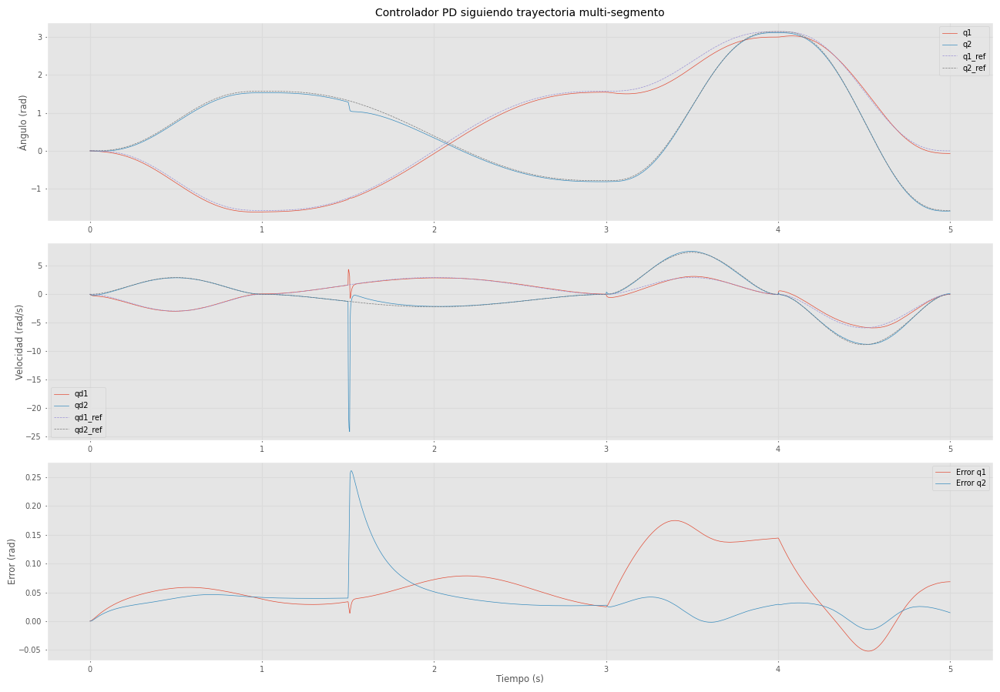

In [222]:
def control_pd(robot, t, q, qd):
    
    # --- A. Buscar índice de referencia ---
    idx = np.searchsorted(traj.t, t, side='right') - 1
    idx = np.clip(idx, 0, len(traj.t)-1)

    q_des  = traj.q[idx]
    qd_des = traj.qd[idx]

    # --- B. Errores ---
    error_q  = q_des - q
    error_qd = qd_des - qd

    # --- C. Ganancias PD ---
    Kp = np.array([50.0, 25.0])
    Kd = np.array([15.0, 4.0])

    tau_control = Kp * error_q + Kd * error_qd

    # --- D. Perturbaciones opcionales ---
    tau_dist = np.array([0.0, 0.0])

    # Escalón
    if 3.0 <= t <= 4.0:
        tau_dist += np.array([10.0, 0.0])

    # Impulso
    if 1.5 <= t <= 1.51:
        tau_dist += np.array([0.0, 100.0])

    # Torque final
    tau = tau_control - tau_dist
    return tau


# ---------------- SIMULACIÓN ----------------
q0 = np.array(q_list[0])      # primer punto de la trayectoria
qd0 = np.array([0.0, 0.0])

tg_pd = dp.fdyn(
    T=t_final,
    q0=q0,
    qd0=qd0,
    Q=control_pd
)

# ---------------- GRAFICOS ----------------
plt.figure(figsize=(13, 9))

# --- 1. Ángulos ---
plt.subplot(3, 1, 1)
plt.plot(tg_pd.t, tg_pd.q[:,0], label="q1")
plt.plot(tg_pd.t, tg_pd.q[:,1], label="q2")

# Trayectoria deseada
plt.plot(traj.t, traj.q[:,0], '--', label="q1_ref")
plt.plot(traj.t, traj.q[:,1], '--', label="q2_ref")

plt.ylabel("Ángulo (rad)")
plt.title("Controlador PD siguiendo trayectoria multi-segmento")
plt.legend(); plt.grid(True)

# --- 2. Velocidades ---
plt.subplot(3, 1, 2)
plt.plot(tg_pd.t, tg_pd.qd[:,0], label="qd1")
plt.plot(tg_pd.t, tg_pd.qd[:,1], label="qd2")

plt.plot(traj.t, traj.qd[:,0], '--', label="qd1_ref")
plt.plot(traj.t, traj.qd[:,1], '--', label="qd2_ref")

plt.ylabel("Velocidad (rad/s)")
plt.legend(); plt.grid(True)

# --- 3. Error ---
err_q1 = traj.q[:,0] - np.interp(traj.t, tg_pd.t, tg_pd.q[:,0])
err_q2 = traj.q[:,1] - np.interp(traj.t, tg_pd.t, tg_pd.q[:,1])

plt.subplot(3, 1, 3)
plt.plot(traj.t, err_q1, label="Error q1")
plt.plot(traj.t, err_q2, label="Error q2")
plt.xlabel("Tiempo (s)")
plt.ylabel("Error (rad)")
plt.legend(); plt.grid(True)

plt.tight_layout()
plt.show()


## Control PD + FF

In [223]:
def control_pd_ff(robot, t, q, qd):

    q_actual = np.array(q)
    qd_actual = np.array(qd)

    # --- 1) Buscar índice correspondiente ---
    if t >= traj.t[-1]:
        idx = -1
    else:
        idx = np.searchsorted(traj.t, t)

    # --- 2) Extraer datos de la trayectoria ---
    q_d = traj.q[idx]
    qd_d = traj.qd[idx]
    qdd_d = traj.qdd[idx]

    # --- 2b) Arreglo para asegurar dimensión correcta (CRÍTICO) ---
    q_d = np.array(q_d).reshape(-1)[:2]
    qd_d = np.array(qd_d).reshape(-1)[:2]
    qdd_d = np.array(qdd_d).reshape(-1)[:2]

    # --- 3) Errores ---
    error_q = q_d - q_actual
    error_qd = qd_d - qd_actual

    # --- 4) PD ---
    Kp = np.array([15, 8])
    Kd = np.array([3, 2])

    tau_pd = Kp * error_q + Kd * error_qd

    # --- 5) Feedforward dinámico ---
    tau_ff = robot.rne(q_d, qd_d, qdd_d)

    # --- 6) Perturbación ---
    tau_dist = np.array([0.0, 0.0])

    # Escalón
    if 3.0 <= t <= 4.0:
        tau_dist += np.array([10.0, 0.0])

    # Impulso
    if 1.5 <= t <= 1.51:
        tau_dist += np.array([0.0, 100.0])

    # --- 7) Torque final ---
    tau = tau_pd + tau_ff - tau_dist

    return tau


q0 = np.array(q_list[0])      # primer punto de la trayectoria
qd0 = np.array([0.0, 0.0])
t_final = traj.t[-1]
tg_pd_ff = dp.fdyn(
    T = t_final,
    q0 = q0,
    qd0 = qd0,
    Q = control_pd_ff
)


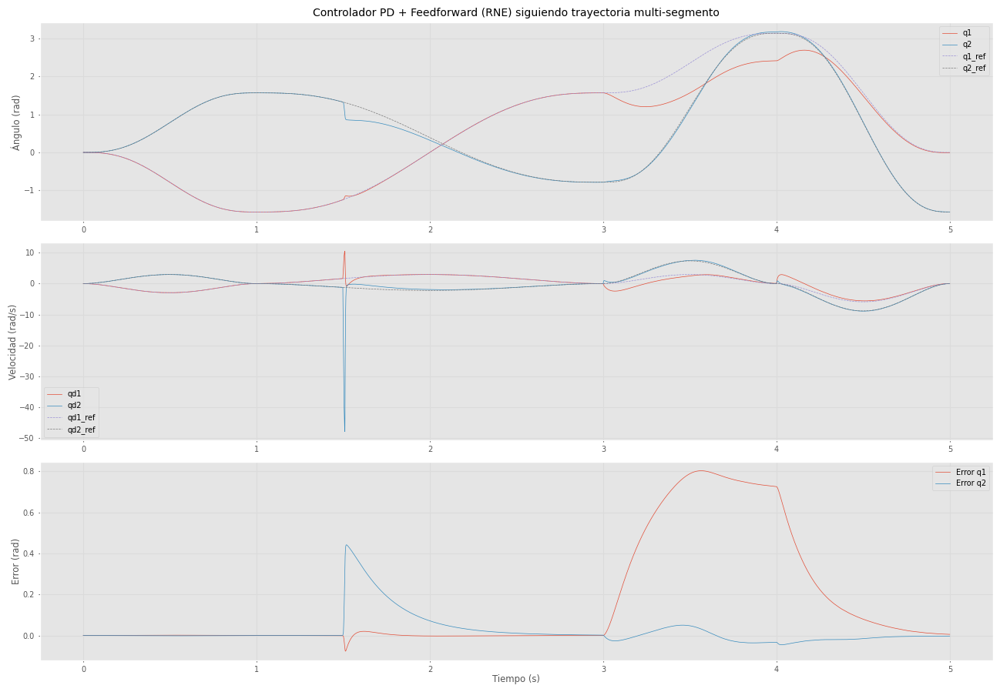

In [224]:
# ---------------- GRAFICOS ----------------
plt.figure(figsize=(13, 9))

# --- 1. Ángulos ---
plt.subplot(3, 1, 1)
plt.plot(tg_pd_ff.t, tg_pd_ff.q[:,0], label="q1")
plt.plot(tg_pd_ff.t, tg_pd_ff.q[:,1], label="q2")

# Trayectoria deseada
plt.plot(traj.t, traj.q[:,0], '--', label="q1_ref")
plt.plot(traj.t, traj.q[:,1], '--', label="q2_ref")

plt.ylabel("Ángulo (rad)")
plt.title("Controlador PD + Feedforward (RNE) siguiendo trayectoria multi-segmento")
plt.legend(); plt.grid(True)

# --- 2. Velocidades ---
plt.subplot(3, 1, 2)
plt.plot(tg_pd_ff.t, tg_pd_ff.qd[:,0], label="qd1")
plt.plot(tg_pd_ff.t, tg_pd_ff.qd[:,1], label="qd2")

plt.plot(traj.t, traj.qd[:,0], '--', label="qd1_ref")
plt.plot(traj.t, traj.qd[:,1], '--', label="qd2_ref")

plt.ylabel("Velocidad (rad/s)")
plt.legend(); plt.grid(True)

# --- 3. Error ---
# Interpolamos la simulación al vector de tiempos de la trayectoria
q1_sim_interp = np.interp(traj.t, tg_pd_ff.t, tg_pd_ff.q[:,0])
q2_sim_interp = np.interp(traj.t, tg_pd_ff.t, tg_pd_ff.q[:,1])

err_q1 = traj.q[:,0] - q1_sim_interp
err_q2 = traj.q[:,1] - q2_sim_interp

plt.subplot(3, 1, 3)
plt.plot(traj.t, err_q1, label="Error q1")
plt.plot(traj.t, err_q2, label="Error q2")

plt.xlabel("Tiempo (s)")
plt.ylabel("Error (rad)")
plt.legend(); plt.grid(True)

plt.tight_layout()
plt.show()



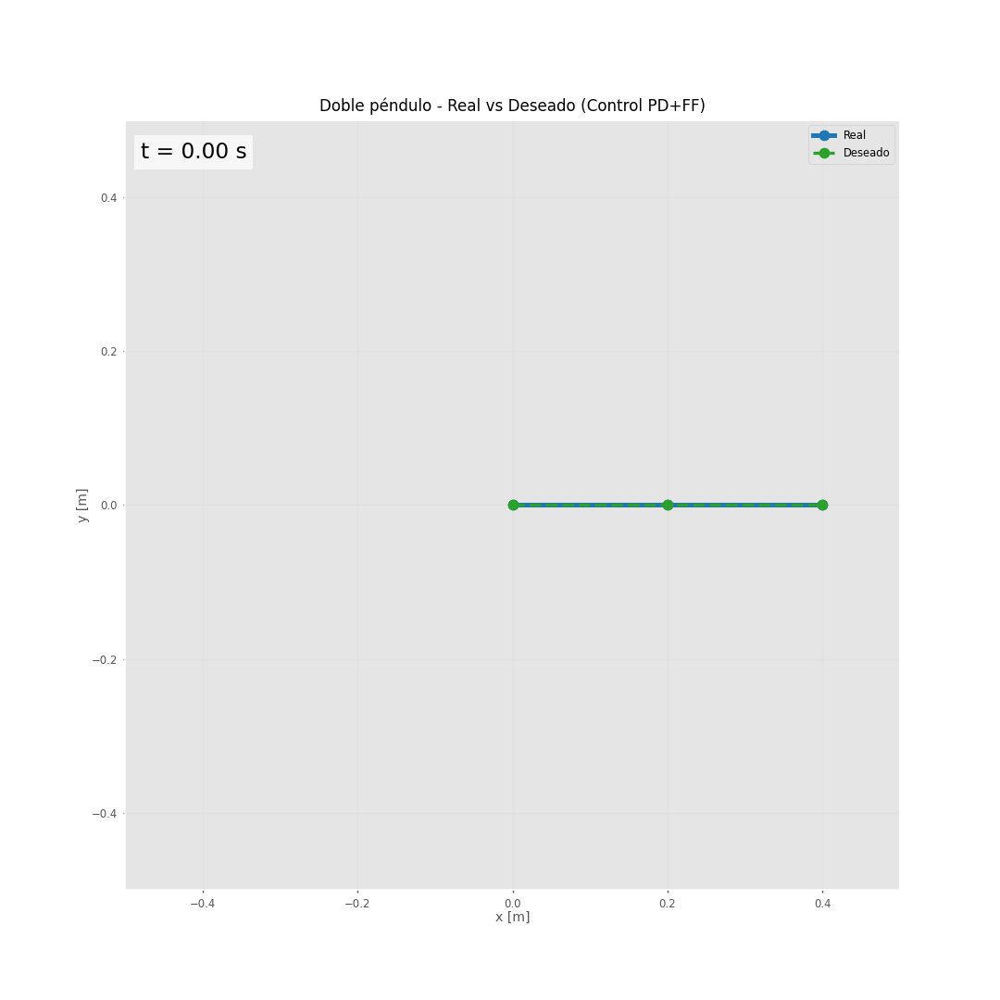

In [219]:
# ======================================
# ANIMACIÓN OPTIMIZADA – REAL vs DESEADO (con tiempo)
# ======================================
from matplotlib.animation import FuncAnimation, PillowWriter

# --- Interpolación de referencia ---
t_real = tg_pd_ff.t
q1_real = tg_pd_ff.q[:, 0]
q2_real = tg_pd_ff.q[:, 1]

q1_ref_interp = np.interp(t_real, traj.t, traj.q[:, 0])
q2_ref_interp = np.interp(t_real, traj.t, traj.q[:, 1])

# Cinemática REAL
x1_r = a1 * np.cos(q1_real)
y1_r = a1 * np.sin(q1_real)
x2_r = x1_r + a2 * np.cos(q1_real + q2_real)
y2_r = y1_r + a2 * np.sin(q1_real + q2_real)

# Cinemática DESEADA
x1_d = a1 * np.cos(q1_ref_interp)
y1_d = a1 * np.sin(q1_ref_interp)
x2_d = x1_d + a2 * np.cos(q1_ref_interp + q2_ref_interp)
y2_d = y1_d + a2 * np.sin(q1_ref_interp + q2_ref_interp)

# -------- FIGURA EN ALTA CALIDAD --------
fig, ax = plt.subplots(figsize=(9, 9), dpi=120)
ax.set_xlim(-0.5, 0.5)
ax.set_ylim(-0.5, 0.5)
ax.set_xlabel('x [m]')
ax.set_ylabel('y [m]')
ax.set_title('Doble péndulo - Real vs Deseado (Control PD+FF)')
ax.grid(True, alpha=0.3)

# Real
line_real, = ax.plot([], [], 'o-', lw=3, color='tab:blue', label='Real')
trace_r, = ax.plot([], [], '-', lw=2, color='tab:blue', alpha=0.25)

# Deseada
line_ref, = ax.plot([], [], 'o--', lw=2, color='tab:green', label='Deseado')
trace_d, = ax.plot([], [], '--', lw=1.8, color='tab:green', alpha=0.3)

ax.legend()

trace_x_r, trace_y_r = [], []
trace_x_d, trace_y_d = [], []

# -------- AGREGAR TEXTO DEL TIEMPO --------
time_text = ax.text(
    0.02, 0.95, "", 
    transform=ax.transAxes, 
    fontsize=14, 
    color='black',
    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none')
)


# -------- FUNCIÓN UPDATE --------
def update(i):
    t_i = t_real[i]

    # Real
    thisx_r = [0, x1_r[i], x2_r[i]]
    thisy_r = [0, y1_r[i], y2_r[i]]
    line_real.set_data(thisx_r, thisy_r)

    trace_x_r.append(x2_r[i])
    trace_y_r.append(y2_r[i])
    trace_r.set_data(trace_x_r, trace_y_r)

    # Deseada
    thisx_d = [0, x1_d[i], x2_d[i]]
    thisy_d = [0, y1_d[i], y2_d[i]]
    line_ref.set_data(thisx_d, thisy_d)

    trace_x_d.append(x2_d[i])
    trace_y_d.append(y2_d[i])
    trace_d.set_data(trace_x_d, trace_y_d)

    # Actualizar tiempo arriba a la izquierda
    time_text.set_text(f"t = {t_i:.2f} s")

    return line_real, trace_r, line_ref, trace_d, time_text


# -------- CREAR ANIMACIÓN --------
steps = 3
frames = range(0, len(t_real), steps)

ani = FuncAnimation(fig, update, frames=frames, interval=40, blit=True)

# -------- GUARDAR GIF EN ALTA CALIDAD --------
writer = PillowWriter(fps=22)

gif_filename = "gifs/PD_FF_vs_trayectoria_HQ_tiempo.gif"
ani.save(gif_filename, writer=writer)

plt.close(fig)
Image(filename=gif_filename)


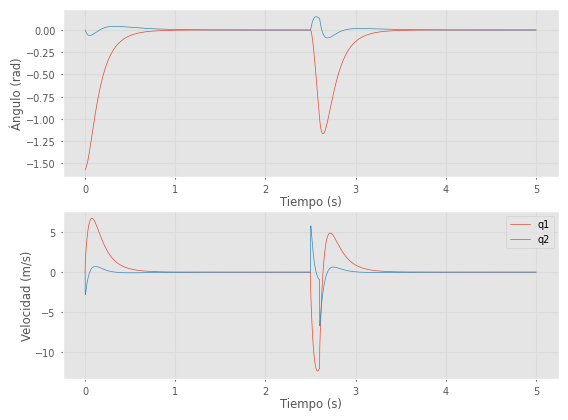

In [44]:
plt.figure()
plt.subplot(2,1,1)
plt.plot(tg_pd_ff.t, tg_pd_ff.q)
plt.xlabel("Tiempo (s)")
plt.ylabel("Ángulo (rad)")

plt.subplot(2,1,2)
plt.plot(tg_pd_ff.t, tg_pd_ff.qd)
plt.legend(['q1', 'q2'])
plt.xlabel("Tiempo (s)")
plt.ylabel("Velocidad (m/s)")
plt.grid(True)
plt.show()

## Control PID

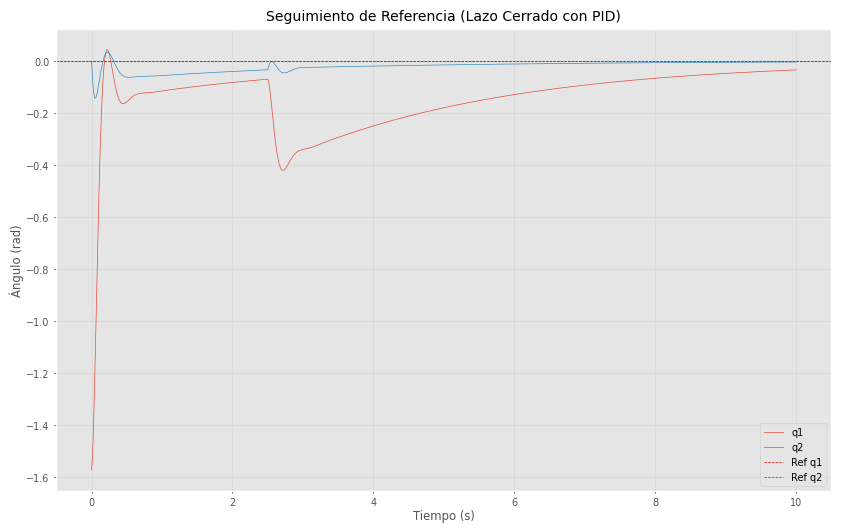

In [38]:
def control_pid(robot, t, q, qd):
    # --- 1. Inicializar el estado del integrador (solo la primera vez) ---
    if not hasattr(control_pid, 'integral'):
        control_pid.integral = np.zeros(robot.n)
        control_pid.last_t = t

    # --- 2. Calcular dt (tiempo desde la última llamada) ---
    dt = t - control_pid.last_t
    
    # --- 3. Calcular errores ---
    q_actual = np.array(q)
    qd_actual = np.array(qd)
    
    error_q = q_deseado_pid - q_actual
    error_qd = np.array([0.0, 0.0]) - qd_actual
    
    # --- 4. Actualizar el término Integral ---
    # Anti-windup simple: solo integramos si el error es pequeño
    # para evitar que el integrador "explote"
    if np.linalg.norm(error_q) < 0.5: # Umbral de ejemplo (0.5 rad)
        control_pid.integral += error_q * dt
    
    # Actualizar el tiempo para el próximo dt
    control_pid.last_t = t

    # --- 5. Definir Ganancias (¡Ki es nueva!) ---
    Kp = np.array([30, 15]) # Proporcional
    Kd = np.array([2, 2]) # Derivativa
    Ki = np.array([10, 5]) # Integral (¡necesitará sintonía!)
    
    # --- 6. Ley de Control PID ---
    tau_p = Kp * error_q
    tau_d = Kd * error_qd
    tau_i = Ki * control_pid.integral
    
    tau_control = tau_p + tau_i + tau_d

        # --- 2. Definir la PERTURBACIÓN ESCALÓN ---
    tau_disturbio = np.array([0.0, 0.0]) # Cero por defecto
    
    t_inicio_escalon = 2.5 # ¿Cuándo empieza el escalón?
    fuerza_escalon = 10   # ¿Qué tan grande es el torque? (3 Nm constantes)
    
    # Aplicamos el escalón DESPUÉS de t=2.5s y se mantiene
    if t > t_inicio_escalon:
        tau_disturbio = np.array([fuerza_escalon, 0.0])
    
    # --- 3. Torque total ---
    # El motor debe aplicar su torque de control MENOS el de la perturbación
    tau = tau_control - tau_disturbio
    return tau



# --- ¡IMPORTANTE! Resetear el estado del integrador antes de cada simulación ---
if hasattr(control_pid, 'integral'):
    del control_pid.integral
    del control_pid.last_t

# Empezamos desde el equilibrio estable
q_deseado_pid = np.array([0.0, 0.0])
q_estable = [-np.pi/2, 0.0]
qd_cero = [0.0, 0.0]

# Simulamos CON fricción y CON el controlador PID
tg_controlado_pid = dp.fdyn(
    T=10, 
    q0=q_estable,
    qd0=qd_cero,
    Q=control_pid # ¡Usamos el controlador PID!
)

# 4.3 Gráfico de Seguimiento (PID)
plt.figure(figsize=(10, 6))
plt.title("Seguimiento de Referencia (Lazo Cerrado con PID)")
plt.plot(tg_controlado_pid.t, tg_controlado_pid.q)

# Dibujamos las líneas de referencia
plt.axhline(y=q_deseado_pid[0], color='r', linestyle='--', label='Ref q1 (0 rad)')
plt.axhline(y=q_deseado_pid[1], color='g', linestyle='--', label='Ref q2 (0 rad)')

plt.legend(['q1', 'q2', 'Ref q1', 'Ref q2'])
plt.xlabel("Tiempo (s)")
plt.ylabel("Ángulo (rad)")
plt.grid(True)
plt.show()

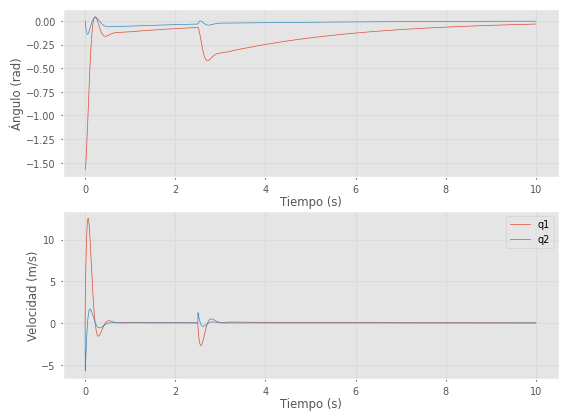

In [39]:
plt.figure()
plt.subplot(2,1,1)
plt.plot(tg_controlado_pid.t, tg_controlado_pid.q)
plt.xlabel("Tiempo (s)")
plt.ylabel("Ángulo (rad)")

plt.subplot(2,1,2)
plt.plot(tg_controlado_pid.t, tg_controlado_pid.qd)
plt.legend(['q1', 'q2'])
plt.xlabel("Tiempo (s)")
plt.ylabel("Velocidad (m/s)")
plt.grid(True)
plt.show()

# otro

Modelo de la dinámica del sistema

$M(q)\ddot{q}=\tau−C(q,\dot{q}​)\dot{q}​−G(q)−(B_{joint})\dot{q}​−\tau_{c​oul}$


In [11]:
from scipy.integrate import solve_ivp

def dynamics(t, y, use_coulomb=False, Fc=None, k_smooth=50.0):
    """
    Dinámica del doble péndulo con opción de fricción viscosa, motriz reflejada y Coulomb (opcional).

    use_coulomb : bool -> Si True, añade fricción de Coulomb suavizada.
    Fc          : np.array -> Coeficientes de fricción Coulomb [N·m].
    k_smooth    : float -> Factor de suavizado para tanh().
    """
    n = dp.n
    q = y[:n]
    qd = y[n:]

    tau = np.zeros(n)
    M = dp.inertia(q)
    C = dp.coriolis(q, qd)
    G = dp.gravload(q)

    # --- Fricción viscosa en la articulación (ya efectiva) ---
    B_vec = np.array([getattr(link, 'B', 0.0) for link in dp.links])
    tau_visc = B_vec * qd

    # --- Fricción de Coulomb opcional (suavizada) ---
    if use_coulomb:
        if Fc is None:
            Fc = np.zeros(n)
        tau_coul = Fc * np.tanh(k_smooth * qd)
    else:
        tau_coul = np.zeros(n)

    tau_fric = tau_visc + tau_coul

    # --- Dinámica final ---
    qdd = np.linalg.solve(M, tau - C @ qd - G - tau_fric)

    return np.concatenate((qd, qdd))


# --- Condiciones iniciales ---
q0 = [np.pi/2, 0.0]
qd0 = [0.001, 0.0]
y0 = np.concatenate((q0, qd0))
t_final = 5.0

# # --- Integración ---
# sol = solve_ivp(
#     dynamics,
#     [0, t_final],
#     y0,
#     method='RK45',
#     t_eval=np.linspace(0, t_final, 1000),
#     rtol=1e-4, atol=1e-6
# )

sol = solve_ivp(
    lambda t, y: dynamics(t, y, use_coulomb=True, Fc=np.array([0.001, 0.001])),
    [0, t_final], y0,
    method='RK45', t_eval=np.linspace(0, t_final, 1000),
    rtol=1e-4, atol=1e-6
)

t = sol.t
q1, q2 = sol.y[0], sol.y[1]
qd1, qd2 = sol.y[2], sol.y[3]


In [12]:
# --- Cálculo de energía total ---
E_kin = np.zeros_like(t)
E_pot = np.zeros_like(t)

for i in range(len(t)):
    q = sol.y[0:2, i]     # [q1, q2]
    qd = sol.y[2:4, i]    # [q̇1, q̇2]
    M = dp.inertia(q)
    G = dp.gravload(q)

    # Energía cinética
    E_kin[i] = 0.5 * qd @ M @ qd

    # Energía potencial (referida a q = 0)
    E_pot[i] = -G @ q

E_tot = E_kin + E_pot


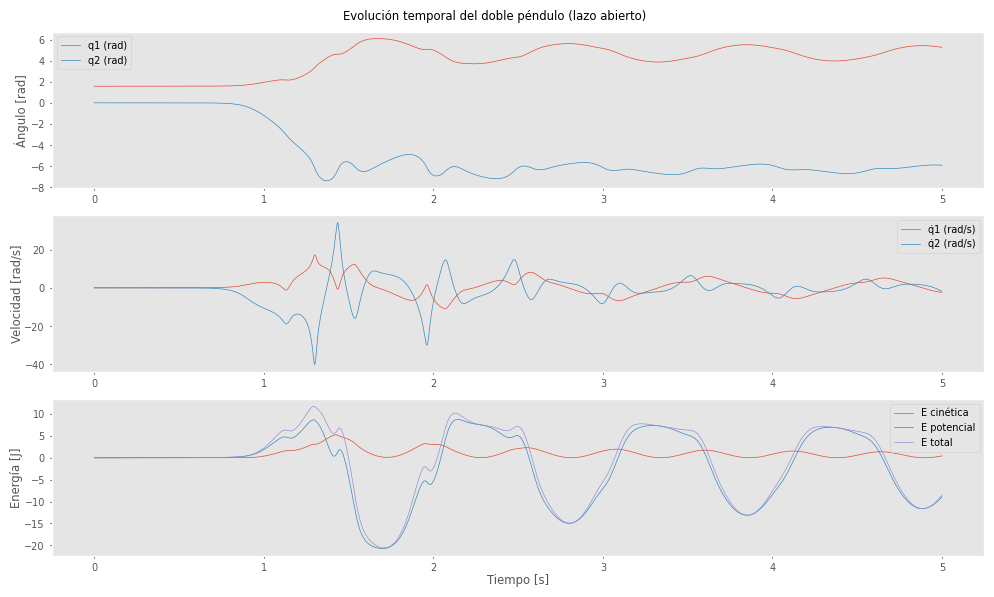

In [13]:
# --- Gráficos de evolución temporal ---
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.plot(t, q1, label='q1 (rad)')
plt.plot(t, q2, label='q2 (rad)')
plt.ylabel('Ángulo [rad]')
plt.legend(); plt.grid()

plt.subplot(3, 1, 2)
plt.plot(t, qd1, label='q̇1 (rad/s)')
plt.plot(t, qd2, label='q̇2 (rad/s)')
plt.ylabel('Velocidad [rad/s]')
plt.legend(); plt.grid()

plt.subplot(3, 1, 3)
plt.plot(t, E_kin, label='E cinética')
plt.plot(t, E_pot, label='E potencial')
plt.plot(t, E_tot, label='E total')
plt.xlabel('Tiempo [s]')
plt.ylabel('Energía [J]')
plt.legend(); plt.grid()

plt.suptitle('Evolución temporal del doble péndulo (lazo abierto)')
plt.tight_layout()
plt.show()


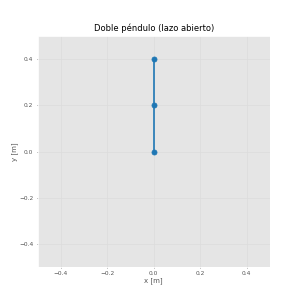

In [14]:
# ======================================
# ANIMACIÓN - DOBLE PÉNDULO (GIF)
# ======================================
from matplotlib.animation import FuncAnimation
from IPython.display import Image

# --- Calcular posiciones de los eslabones ---
a1, a2 = 0.2, 0.2
x1 = a1 * np.cos(q1)
y1 = a1 * np.sin(q1)
x2 = x1 + a2 * np.cos(q1 + q2)
y2 = y1 + a2 * np.sin(q1 + q2)

# --- Crear figura ---
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_xlim(-0.5, 0.5)
ax.set_ylim(-0.5, 0.5)
ax.set_xlabel('x [m]')
ax.set_ylabel('y [m]')
ax.set_title('Doble péndulo (lazo abierto)')
line, = ax.plot([], [], 'o-', lw=2, color='tab:blue')
trace, = ax.plot([], [], '-', lw=1, color='tab:orange', alpha=0.5)  # traza de la punta
trace_x, trace_y = [], []

# --- Función de actualización por frame ---
def update(i):
    # puntos del péndulo
    thisx = [0, x1[i], x2[i]]
    thisy = [0, y1[i], y2[i]]
    line.set_data(thisx, thisy)
    # traza de la punta del último eslabón
    trace_x.append(x2[i])
    trace_y.append(y2[i])
    trace.set_data(trace_x, trace_y)
    return line, trace

# --- Crear animación ---
step = 3  # usar un frame cada 5 muestras
frames = range(0, len(t), step)
ani = FuncAnimation(fig, update, frames=frames, interval=30, blit=True)


# --- Guardar como GIF ---
gif_filename = "doble_pendulo.gif"
ani.save(gif_filename, writer='pillow', fps=30, dpi=60)

plt.close(fig)  # cerrar la figura para que no se muestre el frame estático

# --- Mostrar GIF en la notebook ---
Image(filename=gif_filename)
